# Visualizions of Socio-Economic Status from US Census Bureau API and VTA Ridership Dataset

In [319]:
from census import Census
import sys
import pandas as pd
import json
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib import cm
import dask.dataframe as dd
import pandana, time, os,numpy as np
from pandana.loaders import osm
%matplotlib inline
import dask.dataframe as dd # To read the large VTA ridership data base
from sqlalchemy import create_engine,MetaData # TO read the large VTA ridership file
import seaborn as sns

# Total Population
The data used in this visualization, have been taken from US Census Bureau API.

In [2]:
#Conceting to census bureau API and taking the data
c = Census("984627f5517a0ad3e737af36bb6b736139d2c77a",year =2017)
pop_list = c.acs5.state_county_tract(('NAME', 'B01003_001E'), '06', '085', Census.ALL)

In [4]:
pop_json = json.dumps(pop_list)
pop_df = pd.read_json(pop_json)
pop_df.to_csv("pov-data.csv", index=False)

In [5]:
# Importing San Jose census tracts shapefile to do the calculation for only the tracts that are in San Jose
SJT = gpd.read_file('SanJoseCensusT2018.shp')

In [6]:
pop_df.head()

,NAME,B01003_001E,state,county,tract
0,"Census Tract 5080.04, Santa Clara County, Cali...",6906,6,85,508004
1,"Census Tract 5085.07, Santa Clara County, Cali...",3392,6,85,508507
2,"Census Tract 5085.08, Santa Clara County, Cali...",5410,6,85,508508
3,"Census Tract 5050.09, Santa Clara County, Cali...",9596,6,85,505009
4,"Census Tract 5120.37, Santa Clara County, Cali...",3324,6,85,512037


In [7]:
# Changing the columns name to a similar name in order to join the table with shapefile
SJT=SJT.rename(columns={"TRACTCE": "tract"})
SJT.head()
SJT['tract'] = SJT['tract'].astype('int64', copy=False, errors='raise')

In [8]:
# Merging the shapefile with the census table to export only census tracts that are in San Jose
pop_merged = pd.merge(SJT, pop_df, left_on='tract', right_on='tract')

In [9]:
pop_merged.head()

,STATEFP,COUNTYFP,tract,GEOID,NAME_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,NAME_y,B01003_001E,state,county
0,06,085,501402,06085501402,5014.02,Census Tract 5014.02,G5020,S,524641,0,+37.3453480,-121.8664953,"POLYGON ((-121.87381 37.34412, -121.87361 37.3...","Census Tract 5014.02, Santa Clara County, Cali...",3241,6,85
1,06,085,503305,06085503305,5033.05,Census Tract 5033.05,G5020,S,2325344,0,+37.3198698,-121.8146764,"POLYGON ((-121.82589 37.32237, -121.82546 37.3...","Census Tract 5033.05, Santa Clara County, Cali...",6101,6,85
2,06,085,503306,06085503306,5033.06,Census Tract 5033.06,G5020,S,1667714,0,+37.3314079,-121.8221349,"POLYGON ((-121.83159 37.32840, -121.83153 37.3...","Census Tract 5033.06, Santa Clara County, Cali...",4084,6,85
3,06,085,504102,06085504102,5041.02,Census Tract 5041.02,G5020,S,1344234,0,+37.3640773,-121.8149477,"POLYGON ((-121.82469 37.36234, -121.82428 37.3...","Census Tract 5041.02, Santa Clara County, Cali...",6084,6,85
4,06,085,503313,06085503313,5033.13,Census Tract 5033.13,G5020,S,1617070,0,+37.3313031,-121.7764533,"POLYGON ((-121.78520 37.33868, -121.78503 37.3...","Census Tract 5033.13, Santa Clara County, Cali...",4648,6,85


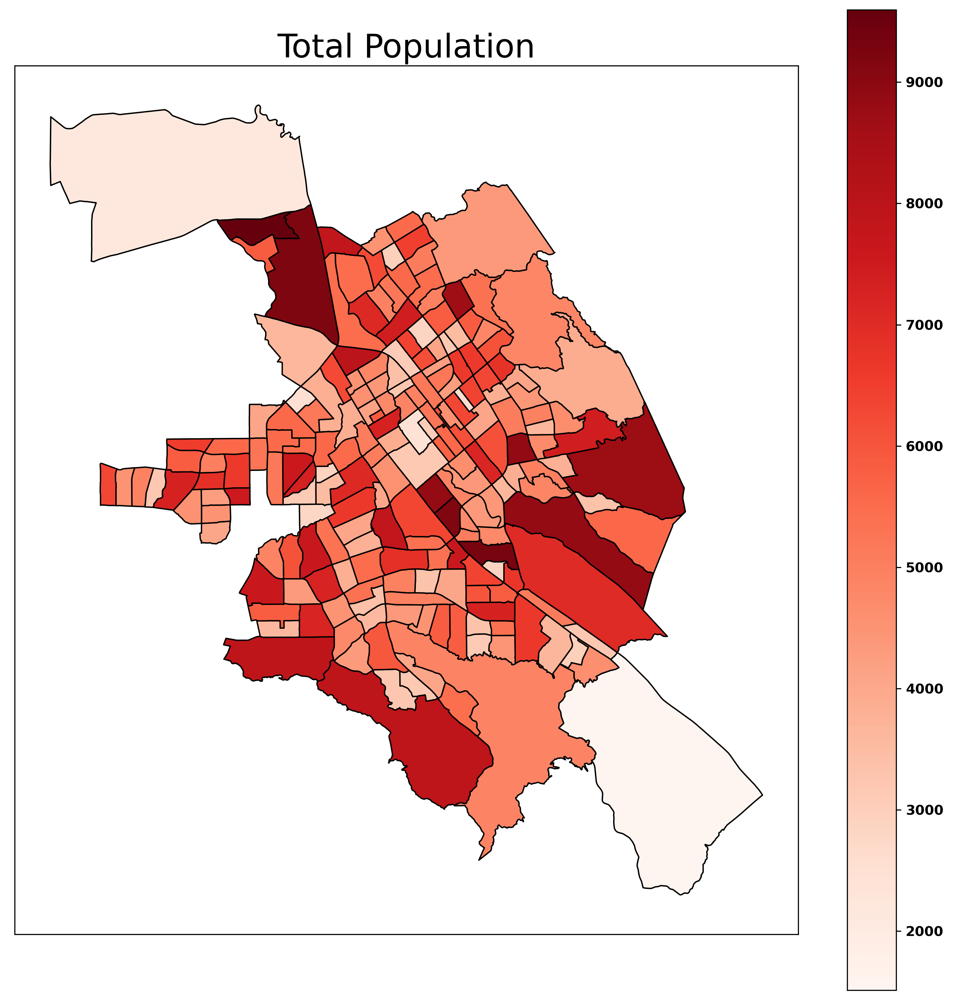

In [328]:
# Plotting the totoal population of census tracts in San Jose
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 14}
cmap = cm.get_cmap('Reds') 
fig= plt.figure(figsize = (10,10), dpi =300)
ax1 = fig.add_axes([0,0,1,1])
pop_merged.plot(column = 'B01003_001E',ax=ax1,legend=True, cmap=cmap, figsize=(10, 10),edgecolors='k')
ax1.set_title('Total Population',fontsize=24)
w = ax1.get_xaxis() 
w.set_visible(False) 
w = ax1.get_yaxis() 
w.set_visible(False) 
plt.show()

#### As indicated on the map, San Jose population is somehow unevenly distributed in the city. The population is more concentrated in suburbs and residents tend to live in places away from downtown.

# Median Household Income

The data used in this visualization, have been taken from US Census Bureau API.

In [323]:
#Conceting to census bureau API and taking the data
median_income = c.acs5.state_county_tract(('NAME', 'B19013_001E'), '06', '085', Census.ALL)
MI_json = json.dumps(median_income)
MI_df = pd.read_json(MI_json)
MI_df.to_csv("MI-data.csv", index=False)

In [324]:
# Merging the shapefile with the census table to export only census tracts that are in San Jose
MI_merged = pd.merge(SJT, MI_df, left_on='tract', right_on='tract')

In [325]:
MI_merged.head()

,STATEFP,COUNTYFP,tract,GEOID,NAME_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,NAME_y,B19013_001E,state,county
0,06,085,501402,06085501402,5014.02,Census Tract 5014.02,G5020,S,524641,0,+37.3453480,-121.8664953,"POLYGON ((-121.87381 37.34412, -121.87361 37.3...","Census Tract 5014.02, Santa Clara County, Cali...",51982,6,85
1,06,085,503305,06085503305,5033.05,Census Tract 5033.05,G5020,S,2325344,0,+37.3198698,-121.8146764,"POLYGON ((-121.82589 37.32237, -121.82546 37.3...","Census Tract 5033.05, Santa Clara County, Cali...",81250,6,85
2,06,085,503306,06085503306,5033.06,Census Tract 5033.06,G5020,S,1667714,0,+37.3314079,-121.8221349,"POLYGON ((-121.83159 37.32840, -121.83153 37.3...","Census Tract 5033.06, Santa Clara County, Cali...",64769,6,85
3,06,085,504102,06085504102,5041.02,Census Tract 5041.02,G5020,S,1344234,0,+37.3640773,-121.8149477,"POLYGON ((-121.82469 37.36234, -121.82428 37.3...","Census Tract 5041.02, Santa Clara County, Cali...",81927,6,85
4,06,085,503313,06085503313,5033.13,Census Tract 5033.13,G5020,S,1617070,0,+37.3313031,-121.7764533,"POLYGON ((-121.78520 37.33868, -121.78503 37.3...","Census Tract 5033.13, Santa Clara County, Cali...",159000,6,85


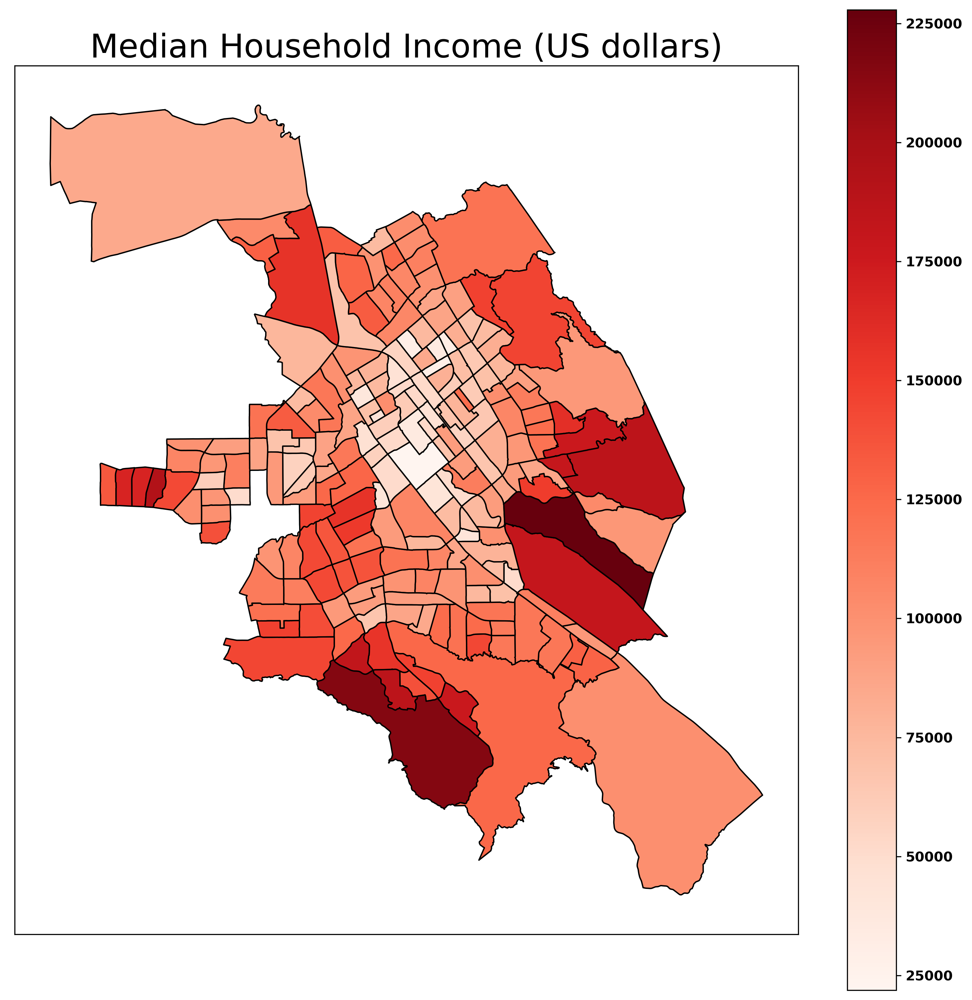

In [327]:
# Plotting the Median Household Income of census tracts in San Jose
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 14}
cmap = cm.get_cmap('Reds') 
fig= plt.figure(figsize = (10,10), dpi =300)
ax1 = fig.add_axes([0,0,1,1])
MI_merged.plot(column = 'B19013_001E',ax=ax1,legend=True, cmap=cmap, figsize=(10, 10),edgecolors='k')
ax1.set_title('Median Household Income (US dollars)',fontsize=24)


w = ax1.get_xaxis() 
w.set_visible(False) 
w = ax1.get_yaxis() 
w.set_visible(False) 
plt.show()

#### Based on the median household income map, downtown residents have less median household income compare to suburb residents. San Jose has several universities in its downtown. Therefore, the student population who live in downtown is one of the factors that contributes to less median household income in downtown compare to suburbs. 

# Public Transportation Users
#### The data used in this visualization, have been taken from US Census Bureau API.


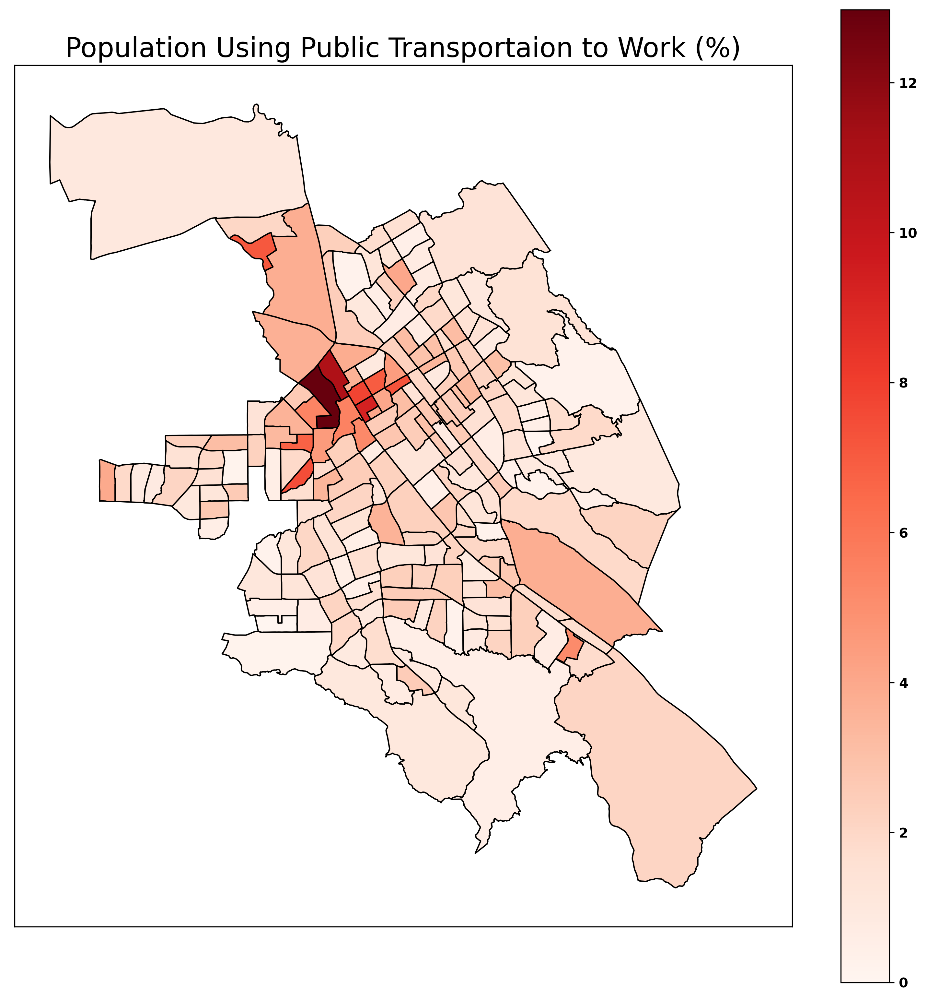

In [331]:
#Conceting to census bureau API and taking the data
TotalPublicTrans = c.acs5.state_county_tract(('NAME', 'B08301_010E'), '06', '085', Census.ALL)

TPT_json = json.dumps(TotalPublicTrans)
TPT_df = pd.read_json(TPT_json)
TPT_df.to_csv("TPT-data.csv", index=False)

# Merging the shapefile with the census table to export only census tracts that are in San Jose
TPT_merged = pd.merge(SJT, TPT_df, left_on='tract', right_on='tract')

# Calculating the percentage of public transportaion users
TPT_merged['B08301_010E'] = 100*TPT_merged['B08301_010E']/pop_merged['B01003_001E']

fig= plt.figure(figsize = (10,10), dpi =300)
ax2 = fig.add_axes([0,0,1,1])
TPT_merged.plot(column = 'B08301_010E',legend=True,ax=ax2, cmap=cmap, figsize=(10, 10),edgecolors='k')
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 14}
cmap = cm.get_cmap('Reds') 
ax2.set_title('Population Using Public Transportaion to Work (%)',fontsize=20)
w = ax2.get_xaxis() 
w.set_visible(False) 
w = ax2.get_yaxis() 
w.set_visible(False) 
plt.show()

#### This map shows the percentage of public transportation users in each census tracts. It indicates downntown residents more likely use public transportation to work compare to residents in other part of the city. The areas with high percentage of public transportation users to work are mostly the ones that are close to universities and colleges. This map also illustrates that residents who live in suburbs tend to use their personal vehicle and are more dependent on their personal vehicle, however, downtown residents are less dependent on having personal vehicle. 

# The Relationship Between Median Household Income and Population Using Public Transportation to Work


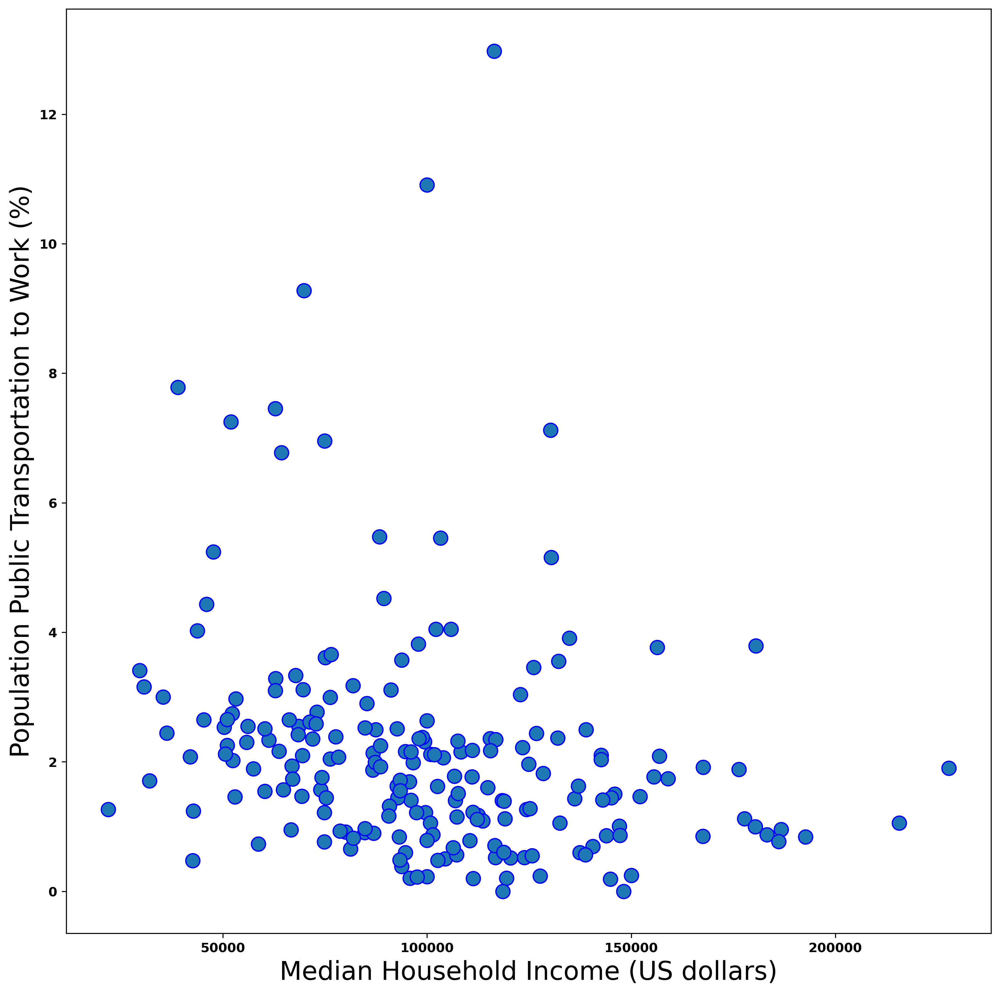

In [290]:
# Scatter plot to find the relationship between median household income and population using public transportation to work 
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 14}
fig= plt.figure(figsize = (10,10), dpi =300)
ax1 = fig.add_axes([0,0,1,1])
TPT_MI_Pop.plot.scatter(x='B19013_001E',y='Ratio_PBT_POP', ax=ax1, s=120,edgecolors='b')
ax1.set_xlabel('Median Household Income (US dollars)',fontsize=20)
ax1.set_ylabel('Population Public Transportation to Work (%)',fontsize=20)
#ax1.set_ylim([0,0.08])
plt.show()

#### The above scatter plot illustrates that census tracts with medium ($\$50000-\$150000$) median houdhold income has the most population ratio of public transporation users. A mild negative slope can be identified between the rate of public transporation usage and median income. 

# Median Age

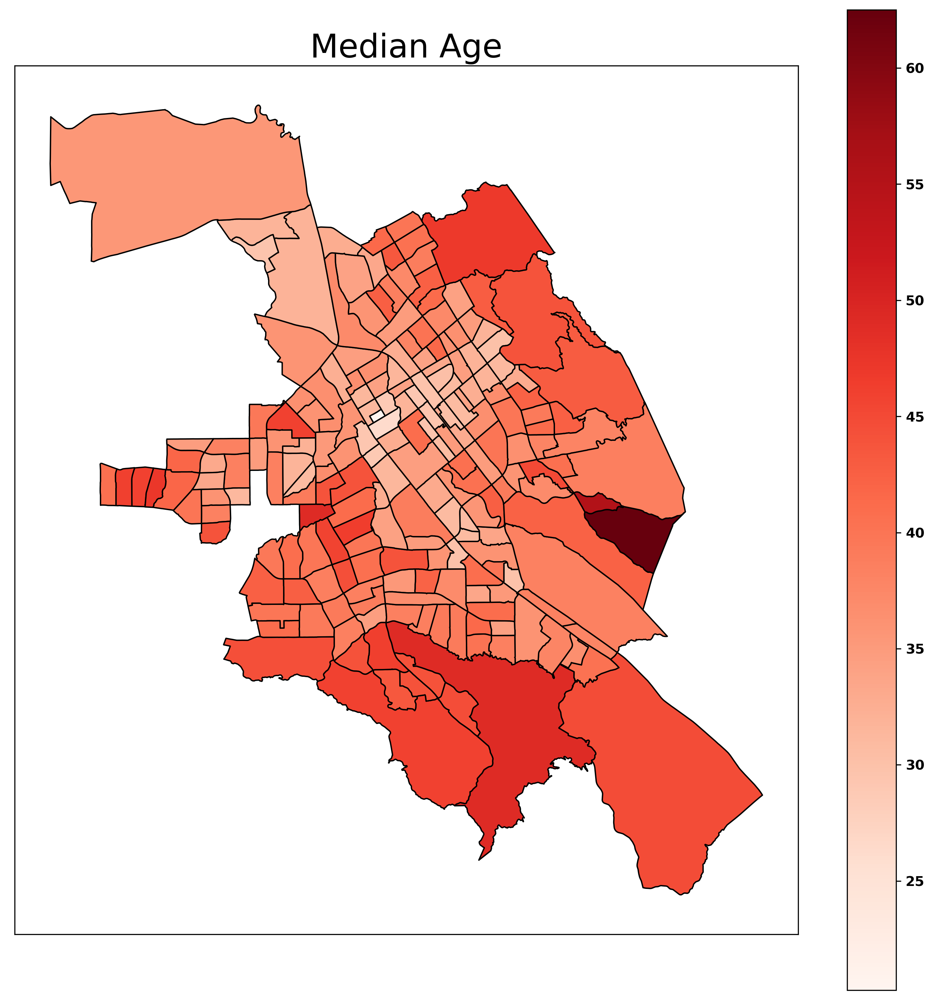

In [291]:
#Conceting to census bureau API and taking the data
Median_Age= c.acs5.state_county_tract(('NAME', 'B01002_001E'), '06', '085', Census.ALL)

MA_json = json.dumps(Median_Age)
MA_df = pd.read_json(MA_json)
MA_df.to_csv("MA-data.csv", index=False)
# Merging the shapefile with the census table to export only census tracts that are in San Jose
MA_merged = pd.merge(SJT, MA_df, left_on='tract', right_on='tract')


font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 14}
cmap = cm.get_cmap('Reds') 
fig= plt.figure(figsize = (10,10), dpi =300)
ax2 = fig.add_axes([0,0,1,1])
MA_merged.plot(column = 'B01002_001E',legend=True,ax=ax2, cmap=cmap, figsize=(10, 10),edgecolors='k')
ax2.set_title('Median Age',fontsize=24)
w = ax2.get_xaxis() 
w.set_visible(False) 
w = ax2.get_yaxis() 
w.set_visible(False) 
plt.show()

This map shows that the population living in the suburbs has more median aga than downtown and highlights the fact that young population prefer to live in city downtown and have access to job opportunities, services and amenities. In addition,one of the factors that may contribute to less median age in downtown compare to other parts of the city is the universities and colleges that are located inadjucent to downtown San Jose.

# The Relation Between Median Age of Census Tracts and Population Using Public Transportation to Work
#### Each marker point shows a census tract

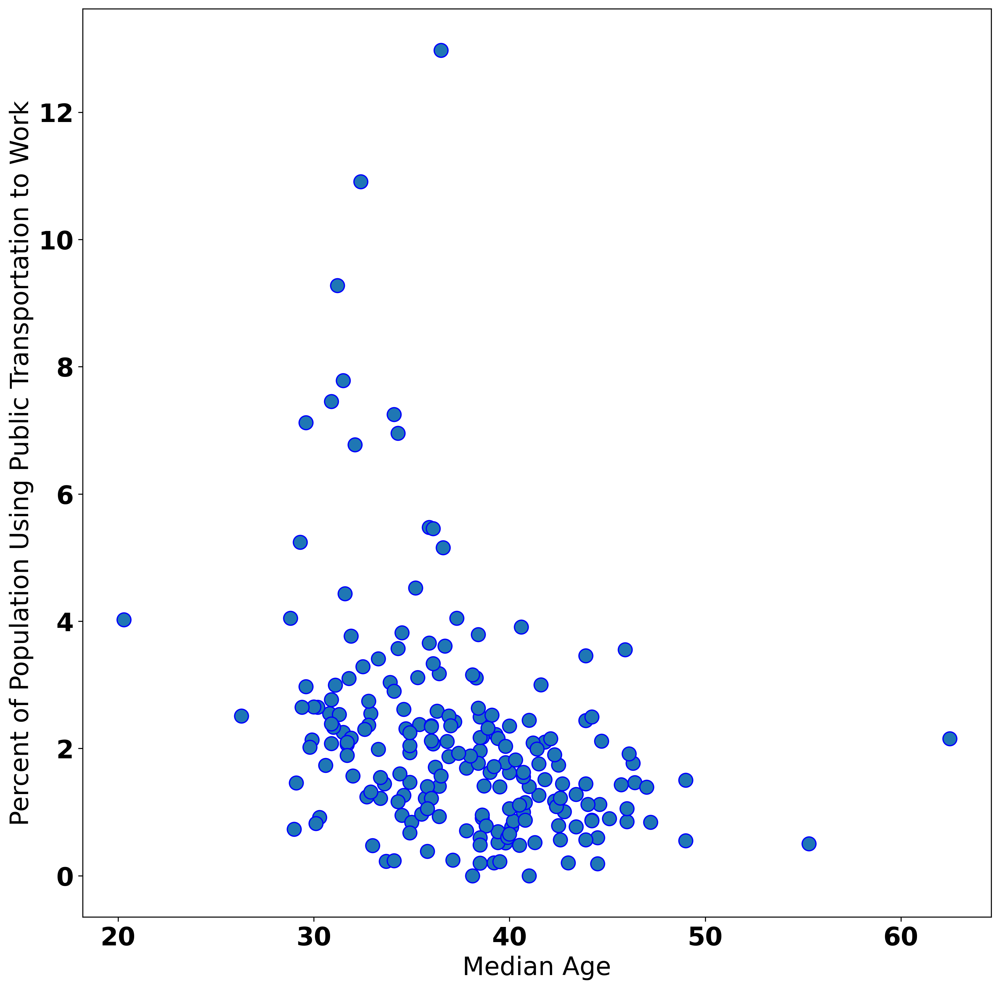

In [335]:
#Conceting to census bureau API and taking the data
Median_Age= c.acs5.state_county_tract(('NAME', 'B01002_001E'), '06', '085', Census.ALL)
MA_json = json.dumps(Median_Age)
MA_df = pd.read_json(MA_json)
MA_df.to_csv("MA-data.csv", index=False)

MA_merged = pd.merge(MA_df, TPT_MI_Pop, left_on='tract', right_on='tract')

fig= plt.figure(figsize = (10,10), dpi =300)
ax1 = fig.add_axes([0,0,1,1])
plt.setp(ax1.get_xticklabels(), fontsize=20) 
plt.setp(ax1.get_yticklabels(), fontsize=20) 

MA_merged.plot.scatter(x='B01002_001E',y='Ratio_PBT_POP', ax=ax1, s=120,edgecolors='b')
ax1.set_xlabel('Median Age',fontsize=20)
ax1.set_ylabel('Percent of Population Using Public Transportation to Work',fontsize=20)
plt.show()

# Line 77 Bus Stops
#### The Adoptive Electric Public Transportation project is a research for the VTA that wants to electrifiy bus route 77 in San Jose, CA. While students majoring civil, industrial and electrical engineering are working on designing and optimizing the battery for buses in this route, I  did some analysis and visualization of ridership in this route.

In [336]:
#Exporting route 77 bus stops with GIS and importing its shapefile
Bus_stops = gpd.read_file('R77_Bus_Stops.shp')


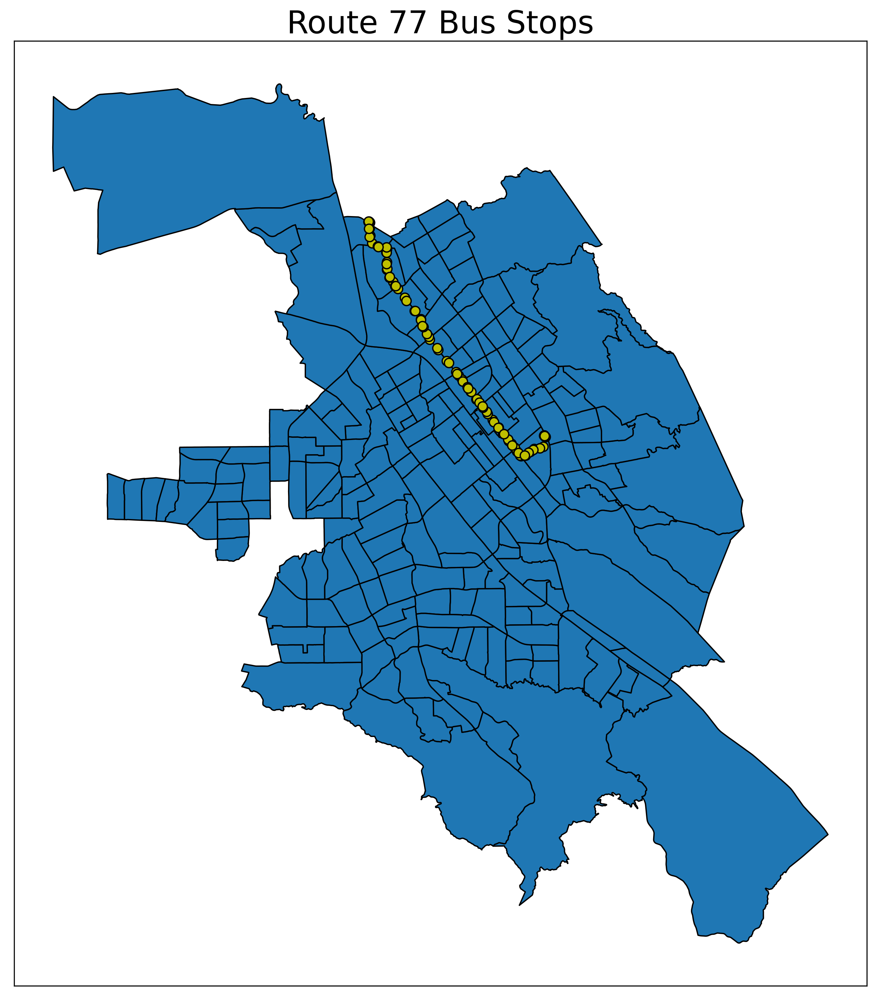

In [337]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 14}
cmap = cm.get_cmap('Reds') 
fig= plt.figure(figsize = (10,10), dpi =300)
ax2 = fig.add_axes([0,0,1,1])
SJT.plot(ax=ax2,  figsize=(10, 10),edgecolors='k')
ax2.scatter(list(Bus_stops['long'].astype('float')),list(Bus_stops['lat'].astype('float')), s=50,c='y',edgecolors='k')
w = ax2.get_xaxis() 
ax2.set_title('Route 77 Bus Stops',fontsize=24)
w.set_visible(False) 
w = ax2.get_yaxis() 
w.set_visible(False) 
plt.show()

#### In the above plot, some bus stops are overlapping because the bus stops may not be exactly the same in south or north direction routes. The ridership data set has data from 2005 to Sep 2017. In these visualizations I used 2014, 2015, and 2016. I did not use 2017 data because it's data does not cover a whole year.

# The Relationship Between Racial Breakdowns Percentage and Population Using Public Transportation to Work

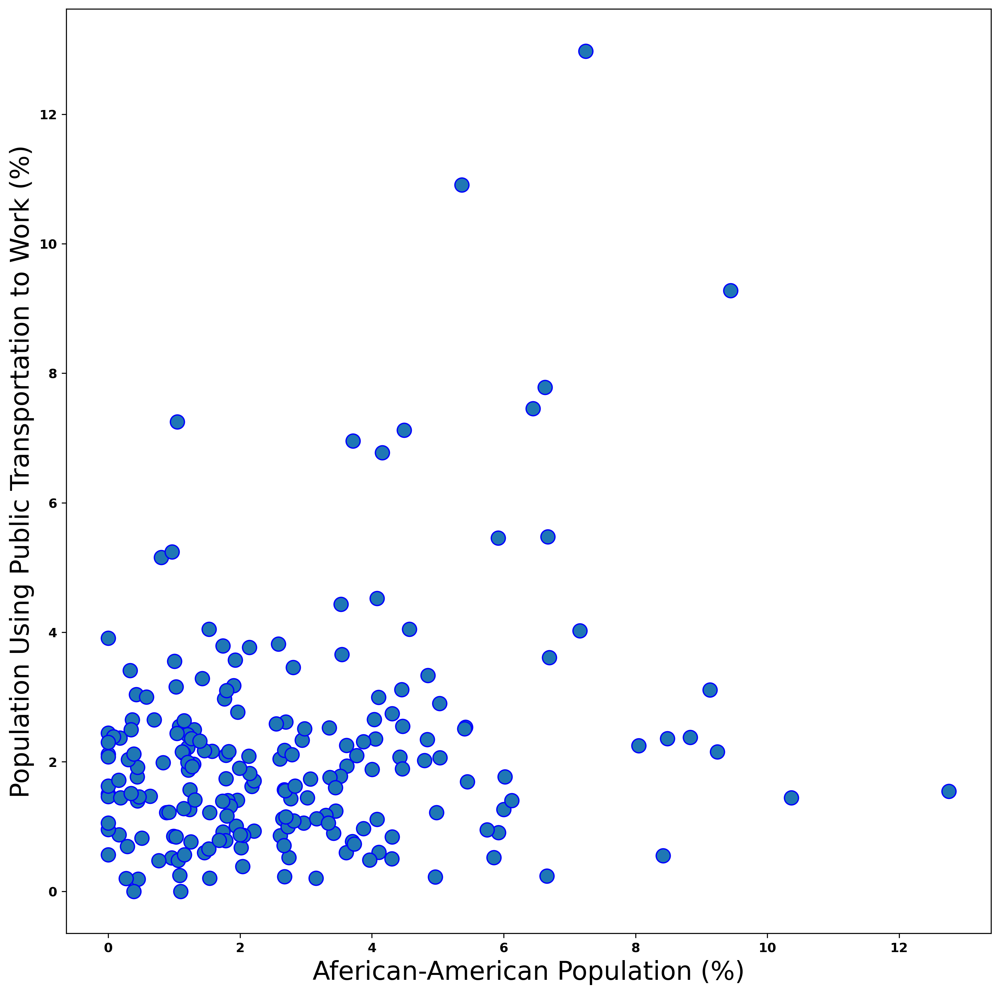

In [341]:
#Conceting to census bureau API and taking the data
AfericanAmerican_Number= c.acs5.state_county_tract(('NAME', 'B03002_004E'), '06', '085', Census.ALL)
AA_json = json.dumps(AfericanAmerican_Number)
AA_df = pd.read_json(AA_json)
AA_df.to_csv("AA-data.csv", index=False)

#Merging African American population dataframe with total population farame to calculate the percentage
AA_merged = pd.merge(pop_merged, AA_df, left_on='tract', right_on='tract')

AA_merged['AA_pop_ratio'] = 100*AA_merged['B03002_004E']/AA_merged['B01003_001E']
AA_PBTR_merged = pd.merge(TPT_MI_Pop, AA_merged, left_on='tract', right_on='tract')

font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 14}
fig= plt.figure(figsize = (10,10), dpi =300)
ax1 = fig.add_axes([0,0,1,1])

AA_PBTR_merged.plot.scatter(x='AA_pop_ratio',y='Ratio_PBT_POP', ax=ax1, s=120,edgecolors='b')
ax1.set_xlabel('Aferican-American Population (%)',fontsize=20)
ax1.set_ylabel('Population Using Public Transportation to Work (%)',fontsize=20)

plt.show()

#### This scatter plot illustrates that the census tracts with more percentage of African American population has slightly more puplic transportation users.

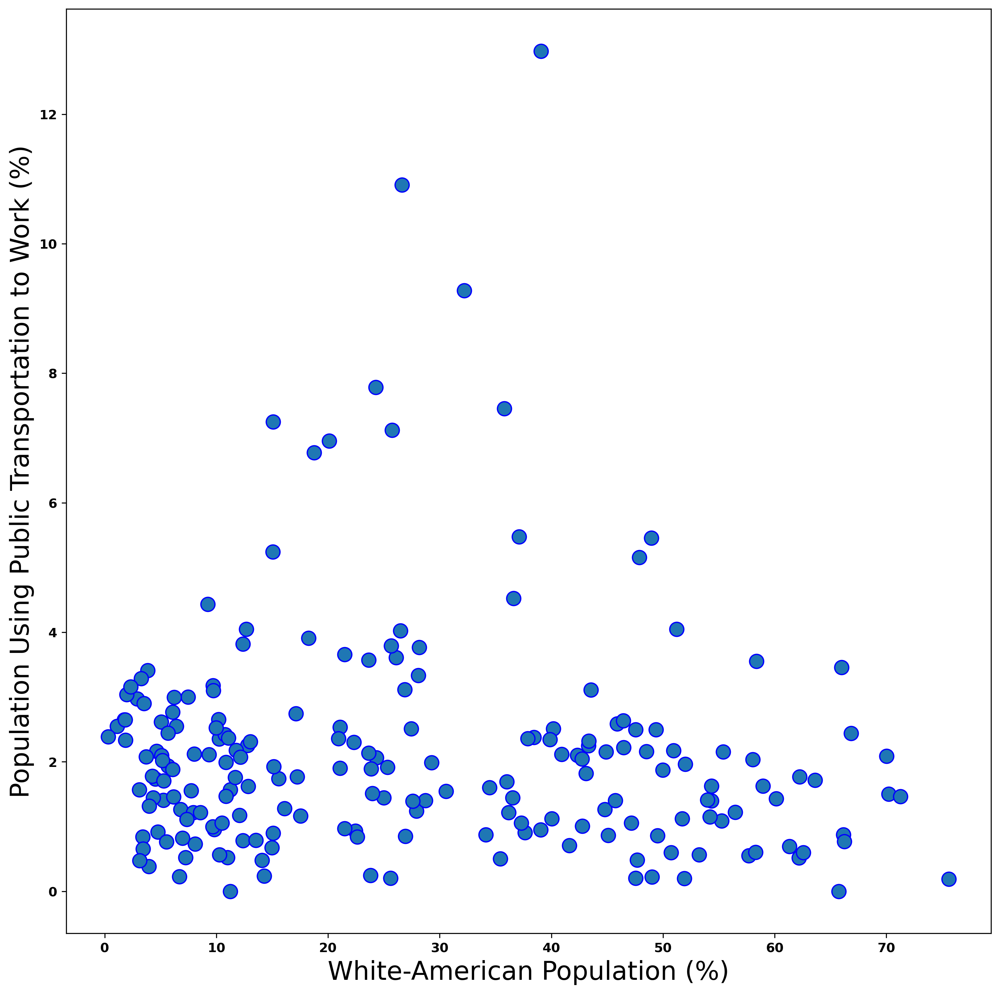

In [342]:
#Conceting to census bureau API and taking the data
WhiteAmerican_Number= c.acs5.state_county_tract(('NAME', 'B03002_003E'), '06', '085', Census.ALL)
WA_json = json.dumps(WhiteAmerican_Number)
WA_df = pd.read_json(WA_json)
WA_df.to_csv("WA-data.csv", index=False)

#Merging White population dataframe with total population farame to calculate the percentage
WA_merged = pd.merge(pop_merged, WA_df, left_on='tract', right_on='tract')
WA_merged['WA_pop_ratio'] = 100*WA_merged['B03002_003E']/WA_merged['B01003_001E']
WA_PBTR_merged = pd.merge(TPT_MI_Pop, WA_merged, left_on='tract', right_on='tract')

font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 14}
fig= plt.figure(figsize = (10,10), dpi =300)
ax1 = fig.add_axes([0,0,1,1])

WA_PBTR_merged.plot.scatter(x='WA_pop_ratio',y='Ratio_PBT_POP', ax=ax1, s=120,edgecolors='b')
ax1.set_xlabel('White-American Population (%)',fontsize=20)
ax1.set_ylabel('Population Using Public Transportation to Work (%)',fontsize=20)

plt.show()

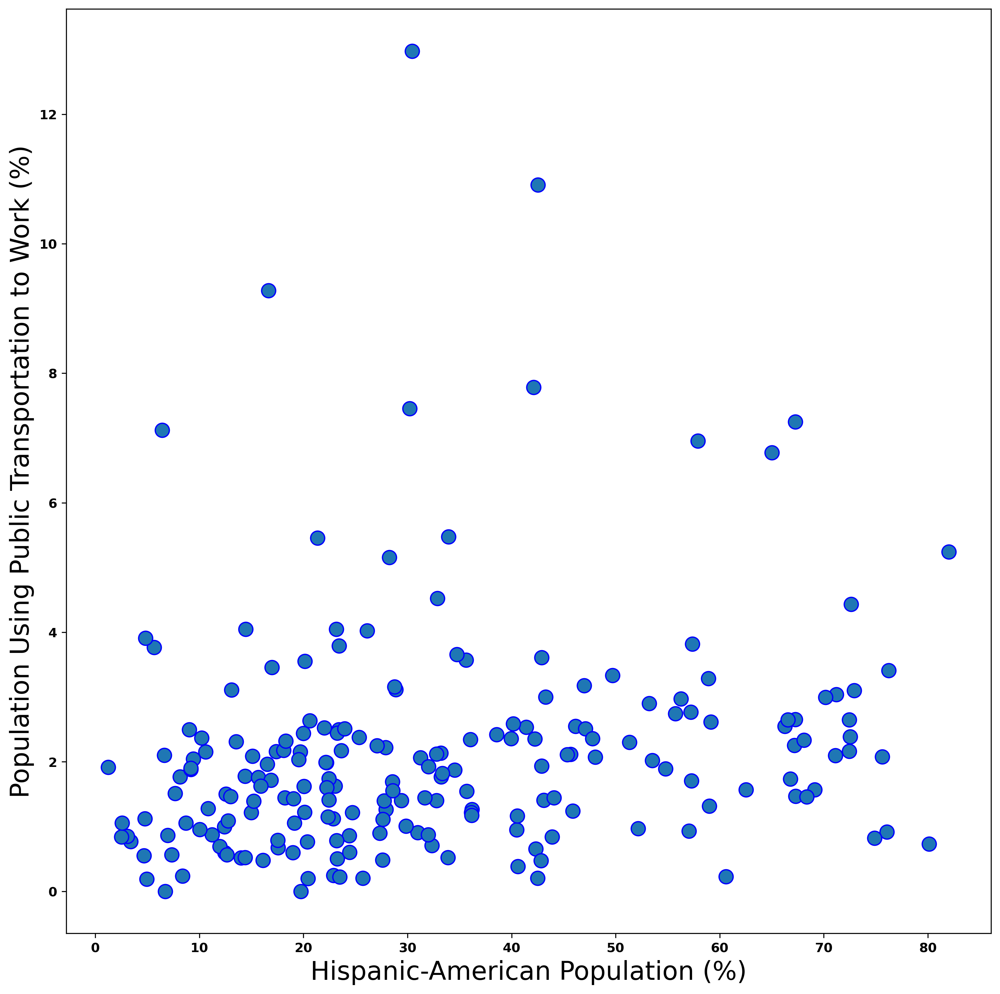

In [343]:
#Conceting to census bureau API and taking the data
HispanicAmerican_Number= c.acs5.state_county_tract(('NAME', 'B03002_012E'), '06', '085', Census.ALL)
HA_json = json.dumps(HispanicAmerican_Number)
HA_df = pd.read_json(HA_json)
HA_df.to_csv("HA-data.csv", index=False)

#Merging Hispanic population dataframe with total population farame to calculate the percentage
HA_merged = pd.merge(pop_merged, HA_df, left_on='tract', right_on='tract')
HA_merged['HA_pop_ratio'] = 100*HA_merged['B03002_012E']/HA_merged['B01003_001E']
HA_PBTR_merged = pd.merge(TPT_MI_Pop, HA_merged, left_on='tract', right_on='tract')
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 14}
fig= plt.figure(figsize = (10,10), dpi =300)
ax1 = fig.add_axes([0,0,1,1])

HA_PBTR_merged.plot.scatter(x='HA_pop_ratio',y='Ratio_PBT_POP', ax=ax1, s=120,edgecolors='b')
ax1.set_xlabel('Hispanic-American Population (%)',fontsize=20)
ax1.set_ylabel('Population Using Public Transportation to Work (%)',fontsize=20)

plt.show()

#### VTA Ridership data can be downloaded at [here ](https://s3-us-west-2.amazonaws.com/gis-open-data-portal/Ridership.zip)
#### Unzipped Data size is ~7GB
#### Dask library and SQLachemy can be used to read file

In [344]:
file = 'Ridership.csv' #
# Reading the large VTA ridership data base by using dask.dataframe
chunks = dd.read_csv(file)

#### Line 77 is selected for further analysis

# Ridership of Each Bus Stop

In [295]:
file = 'Ridership.csv'
chunks2 = dd.read_csv(file)
Line77 =chunks2[chunks2['Line']==77]
Line77['Date'] = dd.to_datetime(Line77['Date'])
Line77_2016 = Line77[(Line77['Date'].dt.year==2016)]
Line77_2016_df = Line77_2016.compute()

In [296]:
Line77_2016_df.head()

,Date,Trip Id,Block,Line,Service,Direction Number,Direction,Pattern,From Time,To Time,Start Location,End Location,On,Off,Stop Id,IVR Number,Stop Name,Sequence
0,2016-09-30,"2,027,313","7,080",77,1,1,SOUTH,SB02,59940,63060,GRATMALL,EASTRIGE,13,20,"3,951","63,951",LUNDY & BERRYESSA,13
1,2016-09-26,"2,027,283","7,771",77,1,0,NORTH,NB02,67200,69720,EASTRIGE,GRATMALL,0,1,"3,915","63,915",LUNDY & GORDY,29
18,2016-09-21,"2,027,270",187,77,1,0,NORTH,NB02,42660,45360,EASTRIGE,GRATMALL,0,1,64,"60,064",KING & KAMMERER,19
82,2016-09-30,"2,027,268","7,773",77,1,0,NORTH,NB02,45060,47700,EASTRIGE,GRATMALL,1,0,58,"60,058",KING & OCALA,12
113,2016-09-03,"2,027,393","7,703",77,2,1,SOUTH,SB02,50760,53580,GRATMALL,EASTRIGE,0,2,45,"60,045",KING & WAVERLY,29


In [281]:
Line77 =chunks[chunks['Line']==77]
Line77['Date'] = dd.to_datetime(Line77['Date'])
Line77_2014 = Line77[(Line77['Date'].dt.year==2014)]
Line77_2015 = Line77[(Line77['Date'].dt.year==2015)]
Line77_2016 = Line77[(Line77['Date'].dt.year==2016)]
Line77_2014_df = Line77_2014.compute()
Line77_2015_df = Line77_2015.compute()
Line77_2016_df = Line77_2016.compute()

StopNames=Line77_2014_df['Stop Name'].unique()
TotalOnStop2014 = []
TotalOnStop2015 = []
TotalOnStop2016 = []

for stop in StopNames:
        TotalOnStop2014.append(Line77_2014_df['On'][Line77_2014_df['Stop Name'] == stop].sum())
        TotalOnStop2015.append(Line77_2015_df['On'][Line77_2015_df['Stop Name'] == stop].sum())
        TotalOnStop2016.append(Line77_2016_df['On'][Line77_2016_df['Stop Name'] == stop].sum())
TotalOffStop2014 = []
TotalOffStop2015 = []
TotalOffStop2016 = []

for stop in StopNames:
        TotalOffStop2014.append(Line77_2014_df['Off'][Line77_2014_df['Stop Name'] == stop].sum())
        TotalOffStop2015.append(Line77_2015_df['Off'][Line77_2015_df['Stop Name'] == stop].sum())
        TotalOffStop2016.append(Line77_2016_df['Off'][Line77_2016_df['Stop Name'] == stop].sum())        

C:\Users\meraz\Anaconda3\envs\Urban_data_analysis\lib\site-packages\ipykernel_launcher.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  import sys
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


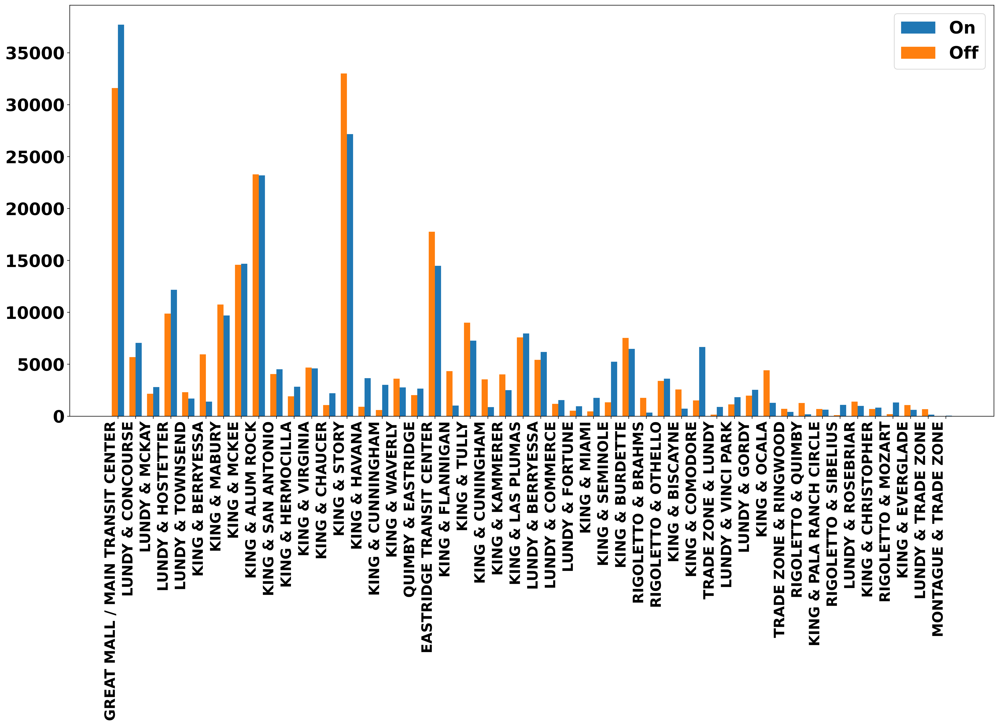

In [282]:
fig = plt.figure(figsize=(18,8),dpi=300)
ax = fig.add_axes([0,0,1,1])
W=0.35
StopNamesInt = (np.arange(len(StopNames)))
ax.bar(StopNamesInt+W/2,TotalOffStop2014,width=W)
ax.bar(StopNamesInt-W/2,TotalOnStop2014,width=W)
ax.set_xticklabels(StopNames, rotation=90, ha='right',fontsize=20)
plt.setp(ax.get_yticklabels(), fontsize=24)
ax.legend(['On', 'Off'],fontsize=24)
ax.set_xticks(StopNamesInt)
plt.show()

# Comparison of Total Ridership in 2014, 2015, and 2016

In [345]:
months=range(1,13)
OnMonthly2014=[]
OnMonthly2015=[]
OnMonthly2016=[]

months_name = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
          'August', 'September', 'October', 'November', 'December']
months = range(1,13)

for i in months:
    OnMonthly2014.append(Line77_2014_df['On'][Line77_2014_df['Date'].dt.month== i].sum())
    OnMonthly2015.append(Line77_2015_df['On'][Line77_2015_df['Date'].dt.month== i].sum())
    OnMonthly2016.append(Line77_2016_df['On'][Line77_2016_df['Date'].dt.month== i].sum())

C:\Users\meraz\Anaconda3\envs\Urban_data_analysis\lib\site-packages\ipykernel_launcher.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  import sys


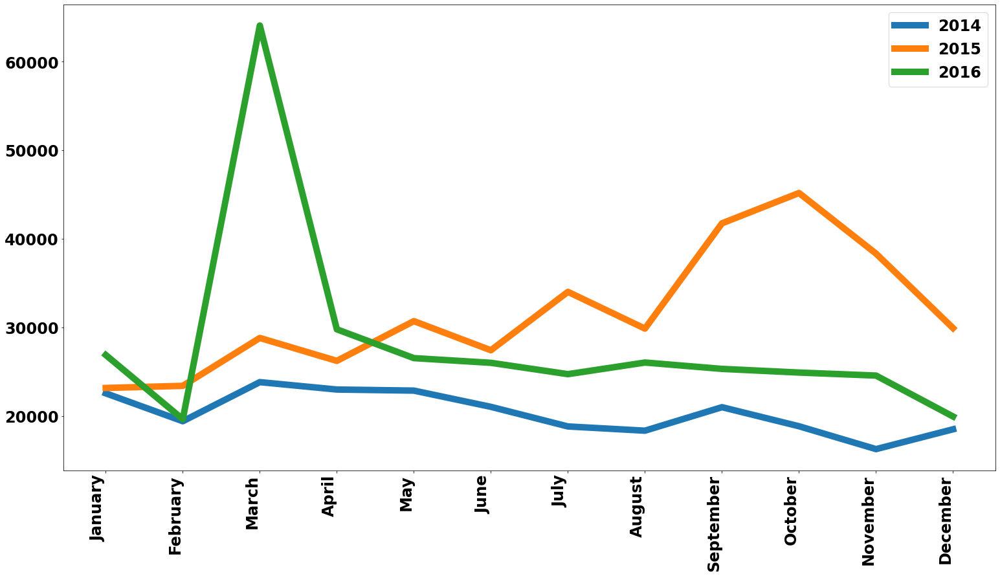

In [346]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_axes([0,0,1,1])
MonthInt = (np.arange(len(months)))
ax.plot(MonthInt,OnMonthly2014,linewidth=10.0)
ax.plot(MonthInt,OnMonthly2015,linewidth=10.0)
ax.plot(MonthInt,OnMonthly2016,linewidth=10.0)
ax.set_xticklabels(months_name, rotation=90, ha='right',fontsize=24)
ax.set_xticks(MonthInt)
plt.setp(ax.get_yticklabels(), fontsize=24) 
ax.legend(['2014','2015','2016'],fontsize=24)
plt.show()

# The Comparison Between Ridership on Weekends, Saturdays, and Sundays

In [301]:
StopNames=Line77_2014_df['Stop Name'].unique()
years=[2014,2015,2016]
Weekdays = []
Saturdays = []
Sundays = []

Weekdays.append(Line77_2014_df['On'][Line77_2014_df['Service']==1].sum())
Saturdays.append(Line77_2014_df['On'][Line77_2014_df['Service']==2].sum())
Sundays.append(Line77_2014_df['On'][Line77_2014_df['Service']==3].sum())

Weekdays.append(Line77_2015_df['On'][Line77_2015_df['Service']==1].sum())
Saturdays.append(Line77_2015_df['On'][Line77_2015_df['Service']==2].sum())
Sundays.append(Line77_2015_df['On'][Line77_2015_df['Service']==3].sum())

Weekdays.append(Line77_2016_df['On'][Line77_2016_df['Service']==1].sum())
Saturdays.append(Line77_2016_df['On'][Line77_2016_df['Service']==2].sum())
Sundays.append(Line77_2016_df['On'][Line77_2016_df['Service']==3].sum())

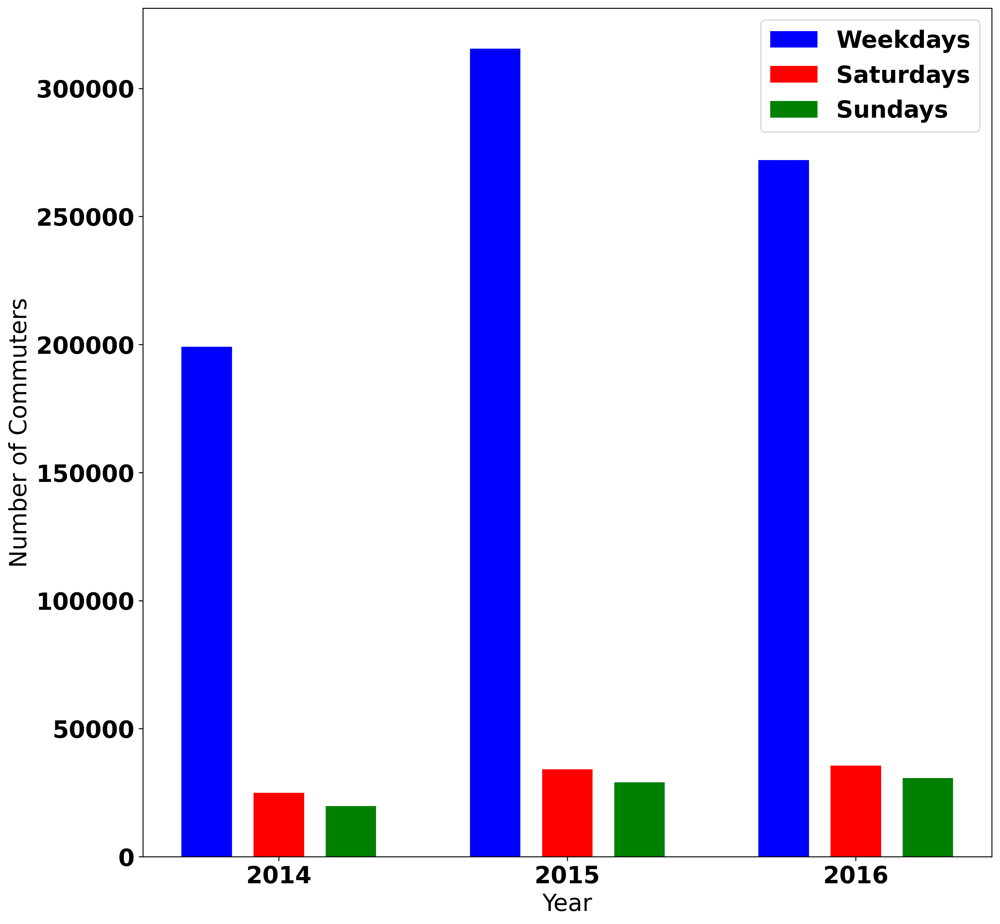

In [348]:
fig = plt.figure(figsize=(10,10),dpi=300)
ax = fig.add_axes([0,0,1,1])
Year = [1,3,5]
Yearname = [2014,2015,2016]
W=0.35

#StopNamesInt = (np.arange(len(StopNames)))
ax.bar(Year[0]-0.5,Weekdays[0],width=W,color = 'b')
ax.bar(Year[0]-0,Saturdays[0],width=W, color = 'r')
ax.bar(Year[0]+0.5,Sundays[0],width=W, color = 'g')

ax.bar(Year[1]-0.5,Weekdays[1],width=W,color = 'b')
ax.bar(Year[1]-0,Saturdays[1],width=W,color = 'r')
ax.bar(Year[1]+0.5,Sundays[1],width=W, color = 'g')

ax.bar(Year[2]-0.5,Weekdays[2],width=W, color = 'b')
ax.bar(Year[2]-0,Saturdays[2],width=W, color = 'r')
ax.bar(Year[2]+0.5,Sundays[2],width=W,color = 'g')
ax.legend(['Weekdays', 'Saturdays', 'Sundays'],fontsize=20)
ax.set_xticks(Year)
ax.set_xticklabels(Yearname,fontsize=20)
ax.xaxis.label.set_size(20)
ax.yaxis.label.set_size(20)
ax.set_xlabel('Year',fontsize=20)
ax.set_ylabel('Number of Commuters',fontsize=20)
plt.setp(ax.get_yticklabels(), fontsize=20) 
plt.show()



In this analysis, I used the method developed by [Geoff Boeing](https://geoffboeing.com/) to show the walking accessibility of all bus stops, more specifically in line 77.

In [298]:
# configure search at a max distance of 1 km for up to the 10 nearest points-of-interest
amenities = ['stop_position']
distance = 1000
num_pois = 10
num_categories = len(amenities) + 1 #one for each amenity, plus one extra for all of them combined

bbox = [37.18, -122.10, 37.50, -121.70] #lat-long bounding box for San Jose, California

bbox_string = '_'.join([str(x) for x in bbox])
net_filename = 'data/network_{}.h5'.format(bbox_string)
poi_filename = 'data/pois_{}_{}.csv'.format('_'.join(amenities), bbox_string)

# keyword arguments to pass for the matplotlib figure
bbox_aspect_ratio = (bbox[2] - bbox[0]) / (bbox[3] - bbox[1])
fig_kwargs = {'facecolor':'w', 
              'figsize':(18, 18 * bbox_aspect_ratio)}

# keyword arguments to pass for scatter plots
plot_kwargs = {'s':7, 
               'alpha':0.9, 
               'cmap':'viridis_r', 
               'edgecolor':'none'}

# network aggregation plots are the same as regular scatter plots, but without a reversed colormap
agg_plot_kwargs = plot_kwargs.copy()
agg_plot_kwargs['cmap'] = 'viridis'

# keyword arguments to pass for hex bin plots
hex_plot_kwargs = {'gridsize':80,
                   'alpha':0.9, 
                   'cmap':'viridis_r', 
                   'edgecolor':'none'}

# keyword arguments to pass to make the colorbar
cbar_kwargs = {}

# keyword arguments to pass to basemap
bmap_kwargs = {}

# color to make the background of the axis
bgcolor = 'k'

start_time = time.time()
if os.path.isfile(poi_filename):
    # if a points-of-interest file already exists, just load the dataset from that
    pois = pd.read_csv(poi_filename)
    method = 'loaded from CSV'
else:   
    # otherwise, query the OSM API for the specified amenities within the bounding box 
    osm_tags = '"public_transport"~"{}"'.format('|'.join(amenities))
    pois = osm.node_query(bbox[0], bbox[1], bbox[2], bbox[3], tags=osm_tags)
    
    # using the '"amenity"~"school"' returns preschools etc, so drop any that aren't just 'school' then save to CSV
    pois = pois[pois['public_transport'].isin(amenities)]
    pois.to_csv(poi_filename, index=False, encoding='utf-8')
    method = 'downloaded from OSM'
    
print('{:,} POIs {} in {:,.2f} seconds'.format(len(pois), method, time.time()-start_time))
pois[['public_transport', 'name', 'lat', 'lon']].head()

start_time = time.time()
if os.path.isfile(net_filename):
    # if a street network file already exists, just load the dataset from that
    network = pandana.network.Network.from_hdf5(net_filename)
    method = 'loaded from HDF5'
else:
    # otherwise, query the OSM API for the street network within the specified bounding box
    network = osm.pdna_network_from_bbox(bbox[0], bbox[1], bbox[2], bbox[3])
    method = 'downloaded from OSM'
    
    # identify nodes that are connected to fewer than some threshold of other nodes within a given distance
    lcn = network.low_connectivity_nodes(impedance=1000, count=10, imp_name='distance')
    network.save_hdf5(net_filename, rm_nodes=lcn) #remove low-connectivity nodes and save to h5
    
print('Network with {:,} nodes {} in {:,.2f} secs'.format(len(network.node_ids), method, time.time()-start_time))

# precomputes the range queries (the reachable nodes within this maximum distance)
# so, as long as you use a smaller distance, cached results will be used
network.precompute(distance + 1)
network.init_pois(num_categories=num_categories, max_dist=distance, max_pois=num_pois)
network.set_pois(category='all', x_col=pois['lon'], y_col=pois['lat'])
# searches for the n nearest amenities (of all types) to each node in the network
all_access = network.nearest_pois(distance=distance, category='all', num_pois=num_pois)

# it returned a df with the number of columns equal to the number of POIs that are requested
# each cell represents the network distance from the node to each of the n POIs
print('{:,} nodes'.format(len(all_access)))
all_access.head()

3,090 POIs loaded from CSV in 0.45 seconds
Network with 202,949 nodes loaded from HDF5 in 184.59 secs
Reading parameters from init_pois()
Reading parameters from init_pois()
202,949 nodes


,1,2,3,4,5,6,7,8,9,10
id,,,,,,,,,,
26027688,55.479000,64.380997,329.346008,386.191010,386.191010,407.769012,465.122986,527.736023,551.330994,641.156006
26027690,77.876999,102.606003,106.456001,147.171005,199.720001,208.059998,261.235992,385.477997,392.368011,392.368011
26027691,427.665985,430.447998,446.738007,446.738007,489.898987,632.090027,695.218994,737.547974,868.406982,1000.000000
26027694,34.763000,204.772003,215.246002,259.811005,298.036011,320.700012,373.876007,438.109009,490.683990,490.683990
26027703,166.828995,173.744003,243.003006,367.859009,546.357971,554.632996,554.632996,560.846008,622.010010,810.750977


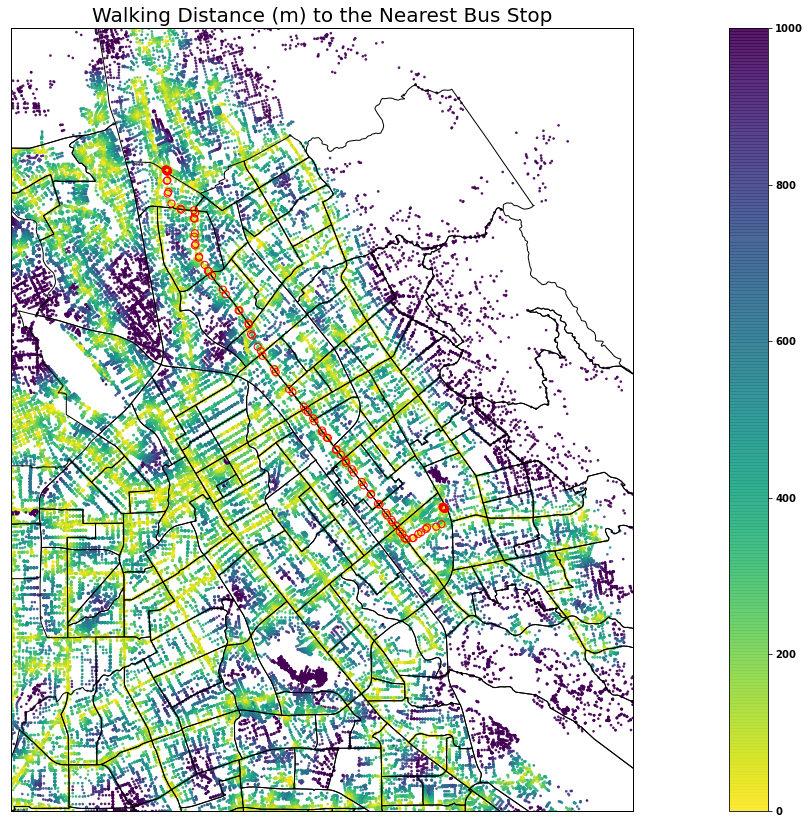

In [300]:
n = 1
bmap, fig, ax = network.plot(all_access[n], bbox=bbox, plot_kwargs=plot_kwargs, fig_kwargs=fig_kwargs, 
                             bmap_kwargs=bmap_kwargs, cbar_kwargs=cbar_kwargs)
SJT.plot(ax=ax,  figsize=(14, 12),facecolor="none", edgecolor="k")
ax.set_facecolor('w')
ax.set_title('Walking Distance (m) to the Nearest Bus Stop', fontsize=20)
ax.scatter(list(Bus_stops['long'].astype('float')),list(Bus_stops['lat'].astype('float')), s=50,edgecolors='r',facecolors='none')
ax.set_ylim(37.25,37.45)
ax.set_xlim(-121.95,-121.75)

fig.savefig('images/accessibility-Line77.png', dpi=300, bbox_inches='tight')

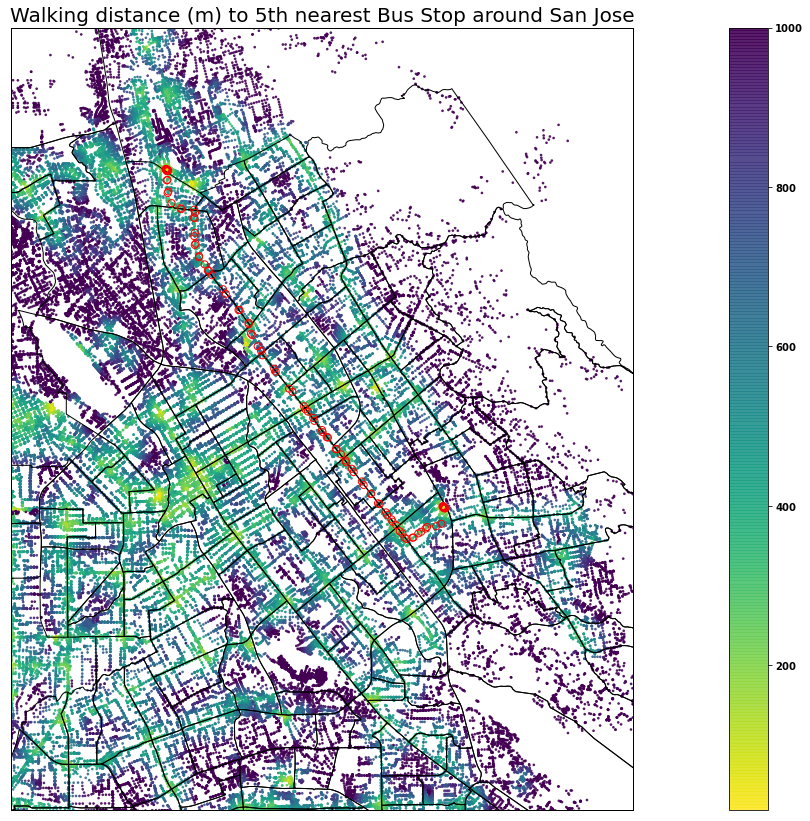

In [304]:
n = 5
bmap, fig, ax = network.plot(all_access[n], bbox=bbox, plot_kwargs=plot_kwargs, fig_kwargs=fig_kwargs, 
                             bmap_kwargs=bmap_kwargs, cbar_kwargs=cbar_kwargs)
ax.set_facecolor(bgcolor)
ax.set_title('Walking distance (m) to 5th nearest Bus Stop around San Jose', fontsize=20)
SJT.plot(ax=ax,  figsize=(14, 12),facecolor="none", edgecolor="k")
ax.set_facecolor('w')
ax.scatter(list(Bus_stops['long'].astype('float')),list(Bus_stops['lat'].astype('float')), s=50,edgecolors='r',facecolors='none')
ax.set_ylim(37.25,37.45)
ax.set_xlim(-121.95,-121.75)

fig.savefig('images/accessibility-5busstop.png', dpi=300, bbox_inches='tight')